# Deep Learning-based Traffic Sign Detection System for Enhancing Road Safety in Battambang

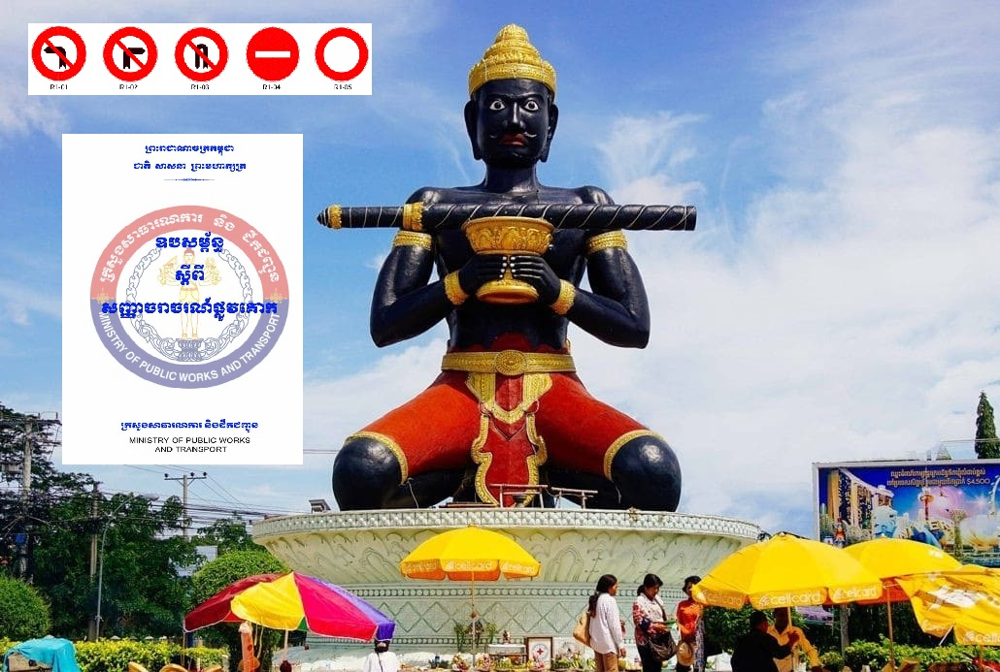

# 0. Dataset

<!-- !pip install Augmentor -->

In [ ]:
# import Augmentor
# import os

# # Define the path to your dataset
# dataset_path = r"D:\FST NUBB\ប្រកួត\Deep Learning-based Traffic Sign Detection System for Enhancing Road Safety in Battambang\Deep learning project\Dataset\datasets"

# # Define the output directory where augmented images will be saved
# output_dir = r"D:/FST NUBB/ប្រកួត/Deep Learning-based Traffic Sign Detection System for Enhancing Road Safety in Battambang/Deep learning project/"

# # Create the output directory if it doesn't exist
# if not os.path.exists(output_dir):
#     os.makedirs(output_dir)

# # Iterate over each subfolder in the dataset folder (input folders)
# for folder_name in os.listdir(dataset_path):
#     folder_path = os.path.join(dataset_path, folder_name)

#     # Check if it's a folder and not a file
#     if os.path.isdir(folder_path):
#         # Initialize the Augmentor pipeline for the specific folder
#         pipeline = Augmentor.Pipeline(folder_path)

#         # Add transformations
#         pipeline.rotate(probability=0.7, max_left_rotation=10, max_right_rotation=10)
#         pipeline.flip_left_right(probability=0.5)
#         pipeline.flip_top_bottom(probability=0.3)
#         pipeline.zoom_random(probability=0.5, percentage_area=0.8)
#         pipeline.skew(probability=0.4, magnitude=0.5)
#         pipeline.random_contrast(probability=0.5, min_factor=0.5, max_factor=2.0)
#         pipeline.random_brightness(probability=0.5, min_factor=0.7, max_factor=1.3)

#         # Set the output directory to the base output directory without creating subfolders
#         print(f"Saving augmented images to: {output_dir}")
        
#         # Generate 200 augmented images for each subfolder
#         pipeline.sample(200)


Scale image to 100x100 and save it into jpg files 

In [ ]:
# import os
# from PIL import Image


# def resize_images(input_folder, output_folder, size=(100, 100)):
#     for folder_num in range(45):
#         input_path = os.path.join(input_folder, str(folder_num))
#         output_path = os.path.join(output_folder, str(folder_num))
#         os.makedirs(output_path, exist_ok=True)

#         for idx, filename in enumerate(os.listdir(input_path), start=1):
#             if filename.lower().endswith(('png', 'jpeg', 'jpg')):
#                 img = Image.open(os.path.join(input_path, filename)).convert('RGB')
#                 img.resize(size).save(os.path.join(output_path, f"{idx}.jpg"), 'JPEG')
# if __name__ == "__main__":
#     input_folder = "D:\FST NUBB\ប្រកួត\Deep Learning-based Traffic Sign Detection System for Enhancing Road Safety in Battambang\Deep learning project\Dataset\datasets"
#     output_folder = "D:\FST NUBB\ប្រកួត\Deep Learning-based Traffic Sign Detection System for Enhancing Road Safety in Battambang\Deep learning project\Scale_dataset"
#     resize_images(input_folder, output_folder)


# print("Done!")

Install libraries

In [ ]:
# !pip install scikit-learn
# !pip install matplotlib
# !pip install opencv-python
# !pip install opencv-python-headless
# !pip install numpy
# !pip install torch
# !pip install torchvision

## 1. Preprocessing Data

### 1.1 Splite data into 3 parts : 
    + 70% for training set 
    + 15% for testing set
    + 15% for validation set

In [ ]:
# import os
# import shutil
# from sklearn.model_selection import train_test_split

# # Define paths
# source_dir = r'D:\FST NUBB\ប្រកួត\Deep Learning-based Traffic Sign Detection System for Enhancing Road Safety in Battambang\Deep learning project\Scale_dataset'
# train_dir = r'D:\FST NUBB\ប្រកួត\Deep Learning-based Traffic Sign Detection System for Enhancing Road Safety in Battambang\Deep learning project\Train'
# test_dir = r'D:\FST NUBB\ប្រកួត\Deep Learning-based Traffic Sign Detection System for Enhancing Road Safety in Battambang\Deep learning project\Test'
# val_dir = r'D:\FST NUBB\ប្រកួត\Deep Learning-based Traffic Sign Detection System for Enhancing Road Safety in Battambang\Deep learning project\Valid'

# # Create target directories
# for target_dir in [train_dir, test_dir, val_dir]:
#     os.makedirs(target_dir, exist_ok=True)

# # Split and copy files
# for subfolder in os.listdir(source_dir):
#     subfolder_path = os.path.join(source_dir, subfolder)
#     if os.path.isdir(subfolder_path):
#         # Create subfolders in target directories
#         for target_dir in [train_dir, test_dir, val_dir]:
#             os.makedirs(os.path.join(target_dir, subfolder), exist_ok=True)
        
#         # Get all files in the subfolder
#         files = os.listdir(subfolder_path)
        
#         # Split data (e.g., 70% train, 20% validation, 10% test)
#         train_files, test_files = train_test_split(files, test_size=0.3, random_state=42)
#         val_files, test_files = train_test_split(test_files, test_size=0.33, random_state=42)  # 20% val, 10% test

#         # Copy files
#         for file in train_files:
#             shutil.copy(os.path.join(subfolder_path, file), os.path.join(train_dir, subfolder, file))

#         for file in val_files:
#             shutil.copy(os.path.join(subfolder_path, file), os.path.join(val_dir, subfolder, file))

#         for file in test_files:
#             shutil.copy(os.path.join(subfolder_path, file), os.path.join(test_dir, subfolder, file))

# print("Dataset split and copied successfully!")


Create dictionaries for Label

In [1]:
num_to_kh_dict = {

    0: "ហាមបត់ឆ្វេង\nNO TURN LEFT\nលេខកូដ : PW03-R1-01\nខ្លឹមសារ : សញ្ញានេះ ហាមយានជំនិះគ្រប់ប្រភេទ បត់ឆ្វេង ។",
    1: "ហាមបត់ស្តាំ\nNO TURN RIGHT\nលេខកូដ : PW03-R1-02\nខ្លឹមសារ : សញ្ញានេះ ហាមយានជំនិះគ្រប់ប្រភេទ បត់ស្តាំ ។",
    2: "ហាមបត់ត្រឡប់ក្រោយ\nNO U TURN\nលេខកូដ : PW03-R1-03\nខ្លឹមសារ : សញ្ញានេះ ហាមយានជំនិះគ្រប់ប្រភេទ បត់ត្រឡប់ ក្រោយ ។",
    3: "ហាមចូល\nNO ENTRY\nលេខកូដ : PW03-R1-04\nខ្លឹមសារ : សញ្ញានេះ ហាមចូលចំពោះយានជំនិះគ្រប់ប្រភេទ ។",
    4: "ផ្លូវបិទចំពោះយានជំនិះគ្រប់ប្រភេទ\nCLOSED FOR ALL VEHICLES\nលេខកូដ : PW03-R1-05\nខ្លឹមសារ : ផ្លូវបិទ ចំពោះយានជំនិះគ្រប់ប្រភេទ ។",
    5: "ផ្លូវបិទ ចំពោះអ្នកប្រើប្រាស់ផ្លូវ\nCLOSED FOR ALL ROAD USERS\nលេខកូដ : PW03-R1-06\nខ្លឹមសារ : ផ្លូវបិទចំពោះអ្នកប្រើប្រាស់ផ្លូវ (ហាមយានជំនិះគ្រប់ប្រភេទ និង ថ្មើរជើងឆ្លងកាត់) ។",
    6: "កំណត់ទម្ងន់សរុប\nTOTAL WEIGHT LIMIT\nលេខកូដ : PW03-R1-07\nខ្លឹមសារ : សញ្ញានេះ ហាមចូលចំពោះយានជំនិះ ដែលមានទម្ងន់ សរុបពិតទាំងបន្ទុក លើសពីអាំងកំណត់ក្នុង ផ្លាកសញ្ញា។",
    7: "កំណត់ទម្ងន់នៅលើអ័ក្សនីមួយៗ\nWEIGHT LIMIT ON ONE AXLE\nលេខកូដ : PW03-R1-08\nខ្លឹមសារ : សញ្ញានេះ ហាមចូលចំពោះយានជំនិះ ដែលមានទម្ងន់ នៅលើអ័ក្ស ( ប៉ុង ) នីមួយៗ លើសពីការកំណត់ក្នុង ផ្លាក សញ្ញា ។",
    8: "កំណត់កំពស់\nHEIGHT LIMIT\nលេខកូដ : PW03-R1-09\nខ្លឹមសារ : សញ្ញានេះហាមចូលចំពោះយានជំនិះ ដែលមាន កំពស់ សរុប គិតទាំងបន្ទុក លើសពីកំរិតកំណត់ ក្នុងផ្លាក សញ្ញា ។",
    9: "កំណត់ទទឹង\nWIDTH LIMIT\nលេខកូដ : PW03-R1-10\nខ្លឹមសារ : សញ្ញានេះ ហាមចូលចំពោះយានជំនិះ ដែលមាន ទទឹង សរុប គិតទាំងបន្ទុក លើសពីទទឹងកំណត់ ក្នុងផ្លាក សញ្ញា ។",
    10: "កំណត់បណ្តោយ\nLENGTH LIMIT\nលេខកូដ : PW03-R1-11\nខ្លឹមសារ : សញ្ញានេះ ហាមចូលចំពោះយានជំនិះ ដែលមាន បណ្តោយ សរុប គិតទាំងបន្ទុក លើសពីប្រវែងកំណត់ ក្នុងផ្លាកសញ្ញា ។",
    11: "ហាមចូលចំពោះកង់យាន ទោចក្រយានយន្ត និង ត្រីចក្រយានយន្ត\nNO ENTRY FOR BICYCLE , MOTORCYCLE AND TRICYCLE\nលេខកូដ : PW03-R1-12\nខ្លឹមសារ : សញ្ញានេះ ហាមចូលចំពោះ កង់យាន, ទោចក្រយានយន្ត និង ត្រីចក្រយានយន្ត ។",
    12: "ហាមចូលចំពោះ ទោចក្រយានយន្ត\nNO ENTRY FOR MOTORCYCLE\nលេខកូដ : PW03-R1-13\nខ្លឹមសារ : សញ្ញានេះ ហាមចូលចំពោះទោចក្រយានយន្ត។",
    13: "ហាមចូលចំពោះយានយន្តគ្រប់ប្រភេទ លើកលែងតែទោចក្រយានយន្ត\nNO ENTRY FOR MOTOR VEHICLES EXCEPT MOTORCYCLES WITHOUT SIDE CARTS\nលេខកូដ : PW03-R1-14\nខ្លឹមសារ : សញ្ញានេះ ហាមចូលចំពោះ យានយន្តគ្រប់ប្រភេទ លើកលែងតែ ទោចក្រយានយន្ត ដែលគ្មានភ្ជាប់ រឺម៉ក សណ្តោង ឬ ទូកង់នៅចំហៀង ។",
    14: "ហាមចូលចំពោះរថយន្តដឹកទំនិញធុនធ្ងន់\nNO ENTRY FOR LARGE-SIZED TRUCK\nលេខកូដ : PW03-R1-15\nខ្លឹមសារ : សញ្ញានេះ ហាមចូលចំពោះ រថយន្តដឹកទំនិញធុនធ្ងន់ ដែល ជាប្រភេទរថយន្ត មានទម្ងន់សរុបលើស ៣.៥០តោន ។",
    15: "ហាមចូលចំពោះរថយន្តក្រុងដឹកអ្នកដំណើរធុនធ្ងន់\nNO ENTRY FOR LARGE-SIZED BUS\nលេខកូដ : PW03-R1-16\nខ្លឹមសារ : សញ្ញានេះ ហាមចូលចំពោះ រថយន្តដឹកអ្នកដំណើរ ធុនធ្ងន់ ដែលជា ប្រភេទរថយន្ត ផ្ទុកអ្នកដំណើរលើសពី ២០ នាក់ គិតទាំងអ្នកបើកបរ ។", 
    16: "ហាមចូលចំពោះយានយន្តគ្រប់ប្រភេទ\nNO ENTRY FOR MOTOR VEHICLES\nលេខកូដ : PW03-R1-17\nខ្លឹមសារ : សញ្ញានេះ ហាមចូលចំពោះយានយន្តគ្រប់ប្រភេទ ។",
    17: "ហាមចូលចំពោះ កង់យាន\nNO ENTRY FOR BICYCLE\nលេខកូដ : PW03-R1-18\nខ្លឹមសារ : សញ្ញានេះ ហាមចូលចំពោះកង់យាន ។",
    18: "ហាមចត\nNO PARKING\nលេខកូដ : PW03-R1-19\nខ្លឹមសារ : សញ្ញានេះ ហាមចត ចំពោះយានជំនិះគ្រប់ប្រភេទ, ប៉ុន្តែអ្នកបើកបរអាចឈប់ដាក់មនុស្ស ឬ ទំនិញ រួចហើយ ចេញទៅវិញៈពេលចាំបាច់ ។",
    19: "ហាមឈប់\nNO STOPPING\nលេខកូដ : PW03-R1-20\nខ្លឹមសារ : សញ្ញានេះ ហាមឈប់ ចំពោះយានជំនិះគ្រប់ប្រភេទ ។",
    20: "ហាមចតចាប់ពីថ្ងៃទី ១ ដល់ថ្ងៃទី ១៥\nNO PARKING FROM 1st TO 15th OF MONTH\nលេខកូដ : PW03-R1-21\nខ្លឹមសារ : សញ្ញានេះ ហាមចត ចំពោះយានជំនិះគ្រប់ប្រភេទ ចាប់ពីថ្ងៃទី១» ដល់ ថ្ងៃទី១៥ ប៉ុន្តែអ្នកបើកបរ អាចឈប់ដាក់មនុស្ស ឬ ទំនិញ រួចហើយ ចេញទៅវិញៈ ពេលចាំបាច់ ។ ការផ្លាស់ប្តូរវេន រវាងថ្ងៃទី១៥ ទៅ ថ្ងៃទី១៦ ប្រព្រឹត្តទៅនៅម៉ោង ២១:០០ នៅ ថ្ងៃទី១៥ ។",
    21: "ហាមចតចាប់ពីថ្ងៃទី ១៦ ដល់ថ្ងៃទី ៣១\nNO PARKING FROM 16th TO 31st OF MONTH\nលេខកូដ : PW03-R1-22\nខ្លឹមសារ : សញ្ញានេះ ហាមចត ចំពោះយានជំនិះគ្រប់ប្រភេទ ចាប់ពីថ្ងៃទី១៦ ដល់ ថ្ងៃទី៣១ នៃខែ ប៉ុន្តែអ្នកបើកបរ អាចឈប់ដាក់មនុស្ស ឬ ទំនិញ រួចហើយ ចេញទៅវិញៈ ពេលចាំបាច់ ។ ការផ្លាស់ប្តូរវេន រវាងថ្ងៃទី៣១ ទៅ ថ្ងៃទី១ ប្រព្រឹត្តទៅនៅម៉ោង ២១:០០ នៅ ថ្ងៃទី៣១ ។",
    22: "ហាមចតថ្ងៃសេស\nNO PARKING ON ODD DAYS\nលេខកូដ : PW03-R1-23\nខ្លឹមសារ : សញ្ញានេះ ហាមចត ចំពោះយានជំនិះគ្រប់ប្រភេទ នៅថ្ងៃសេស នៃខែ ប៉ុន្តែអ្នកបើកបរអាចឈប់ដាក់មនុស្ស ឬ ទំនិញ រួចហើយ ចេញទៅវិញៈពេលចាំបាច់ ។ ការផ្លាស់ប្តូរវេនរវាង ថ្ងៃសេស ទៅថ្ងៃគូ ប្រព្រឹត្តទៅ នៅម៉ោង ២១:០០ នៅ ថ្ងៃសេស ។",
    23: "ហាមចតថ្ងៃគូ\nNO PARKING ON EVEN DAYS\nលេខកូដ : PW03-R1-24\nខ្លឹមសារ : សញ្ញានេះ ហាមចត ចំពោះយានជំនិះគ្រប់ប្រភេទ នៅថ្ងៃគូ នៃខែ ប៉ុន្តែអ្នកបើកបរអាចឈប់ដាក់មនុស្ស ឬ ទំនិញ រួចហើយ ចេញទៅវិញៈពេលចាំបាច់ ។ ការផ្លាស់ប្តូរវេនរវាង ថ្ងៃគូ ទៅថ្ងៃសេស ប្រព្រឹត្តទៅ នៅម៉ោង ២១:០០ នៅ ថ្ងៃគូ ។",
    24: "ហាមវ៉ាជែង\nNO OVERTAKE\nលេខកូដ : PW03-R1-25\nខ្លឹមសារ : សញ្ញានេះ ហាមវ៉ាជែង ចំពោះរថយន្តគ្រប់ប្រភេទ លើកលែងតែទោចក្រយានយន្ត។",
    25: "ចប់ការហាមវ៉ាជែង\nEND OF NO OVERTAKING\nលេខកូដ : PW03-R1-26\nខ្លឹមសារ : សញ្ញានេះ ចប់ការហាមវ៉ាជែង ចំពោះយានយន្ត គ្រប់ប្រភេទ ។",
    26: "ហាមវ៉ាជែងចំពោះរថយន្តដឹកទំនិញធុនធ្ងន់\nNO OVERTAKING FOR LARGE-SIZE TRUCK\nលេខកូដ : PW03-R1-27\nខ្លឹមសារ : សញ្ញានេះ ហាមវ៉ាជែង ចំពោះរថយន្តដឹកទំនិញធុនធ្ងន់ដែលមានទម្ងន់សរុបលើស 3.5តោន ។",
    27: "ចប់ការហាមវ៉ាជែងចំពោះរថយន្តដឹកទំនិញធុនធ្ងន់\nEND OF NO OVERTAKING FOR LARGE-SIZE TRUCK\nលេខកូដ : PW03-R1-28\nខ្លឹមសារ : សញ្ញានេះ ចប់ការហាមវ៉ាជែង ចំពោះរថយន្តដឹកទំនិញធុនធ្ងន់ ដែលមានទម្ងន់សរុបលើស 3.5តោន ។",
    28: "ហាមវ៉ាជែង ចំពោះរថយន្តដឹកទំនិញធុនធ្ងន់ ប្រហាក់ ប្រហែលគ្នា\nNO OVERTAKE FOR SIMILAR LARGE-SIZE TRUCK\nលេខកូដ : PW03-R1-29\nខ្លឹមសារ : សញ្ញានេះ ហាមវ៉ាជែង ចំពោះរថយន្តដឹកទំនិញធុនធ្ងន់ដែលមានទំហំប្រហាក់ប្រហែលគ្នា ។",
    29: "ចប់ការហាមវ៉ាជែង ចំពោះរថយន្តដឹកទំនិញធុនធ្ងន់ ប្រហាក់ ប្រហែលគ្នា\nEND OF NO OVERTAKE FOR SIMILAR LARGE-SIZE TRUCK\nលេខកូដ : PW03-R1-30\nខ្លឹមសារ : សញ្ញានេះ ចប់ការហាមវ៉ាជែង ចំពោះរថយន្តដឹកទំនិញ ធុនធ្ងន់ដែលមានទំហំប្រហាក់ប្រហែលគ្នា ។",
    30: "ហាមស៊ីផ្លេ\nNO HORN\nលេខកូដ : PW03-R1-31\nខ្លឹមសារ : សញ្ញានេះ ហាមស៊ីផ្លេ ចំពោះយានជំនិះគ្រប់ប្រភេទ លើកលែងតែករណីអាចមានគ្រោះថ្នាក់បន្ទាន់។",
    31: "ចប់ការហាមស៊ីផ្លេ\nEND OF NO HORN\nលេខកូដ : PW03-R1-32\nខ្លឹមសារ : សញ្ញានេះ ចប់ការហាមស៊ីផ្លេ ចំពោះយានជំនិះគ្រប់ ប្រភេទ ។",
    32: "ហាមចូលចំពោះទោចក្រយានយន្តមានសណ្តោង\nNO ENTRY FOR MOTORCYCLE DRAWN VEHICLES\nលេខកូដ : PW03-R1-33\nខ្លឹមសារ : សញ្ញានេះ ហាមចូលចំពោះទោចក្រយានយន្ត ដែល មានសណ្តោងរ៉ឺម៉ក ឬ រទេះ ។",
    33: "ហាមចូលចំពោះរទេះអូសទាញដោយសត្វ\nNO ENTRY FOR ANIMAL DRAWN VEHICLES\nលេខកូដ : PW03-R1-34\nខ្លឹមសារ : សញ្ញានេះ ហាមចូលចំពោះរទេះ ដែលអូសទាញ ដោយសត្វ ។",
    34: "ហាមអូស ឬ រុញរទេះចូល\nNO ENTRY FOR HAND-CARTS\nលេខកូដ : PW03-R1-35\nខ្លឹមសារ : សញ្ញានេះ ហាមអូស ឬ រុញរទេះចូល ។",
    35: "ហាមចូលចំពោះ យានយន្តកសិកម្ម\nNO ENTRY FOR AGRICULTURAL MOTOR VEHICLES\nលេខកូដ : PW03-R1-36\nខ្លឹមសារ : សញ្ញានេះ ហាមចូលចំពោះយានយន្តកសិកម្ម គ្រប់ប្រភេទ ។",
    36: "ហាមចូលចំពោះរថយន្តដឹកទំនិញធុនធ្ងន់មានសណ្តោង\nNO ENTRY FOR COMBINATION VEHICLES\nលេខកូដ : PW03-R1-37\nខ្លឹមសារ : សញ្ញានេះ ហាមចូល ចំពោះរថយន្តដឹកទំនិញធុនធ្ងន់ ដែលមានសណ្តោង ។",
    37: "ហាមទុកគម្លាតសុវត្ថិភាព តិចជាង ៧០ ម៉ែត្រ ចំពោះរថយន្តតូច\nDO NOT KEEP SAFETY DISTANCE LESS THAN 70m FOR PASSENGER CARS\nលេខកូដ : PW03-R1-38\nខ្លឹមសារ : សញ្ញានេះ ហាមអ្នកបើកបររថយន្តតូច ទុកគម្លាត សុវត្ថិភាពតិចជាងចម្ងាយ ដូចមានកំណត់ក្នុងផ្លាក សញ្ញា ។",
    38: "ហាមទុកគម្លាតសុវត្ថិភាព តិចជាង ១០០ ម៉ែត្រ ចំពោះរថយន្តធំ\nDO NOT KEEP SAFETY DISTANCE LESS THAN 100m FOR TRUCKS\nលេខកូដ : PW03-R1-39\nខ្លឹមសារ : សញ្ញានេះ ហាមអ្នកបើកបររថយន្តធំ ទុកគម្លាត សុវត្ថិភាពតិចជាងចម្ងាយ ដូចមានកំណត់ក្នុងផ្លាក សញ្ញា ។",
    39: "ហាមចូលចំពោះយានយន្តដឹកទំនិញងាយឆេះ ឬ ងាយផ្ទុះ\nNO ENTRY FOR VEHICLE LOADING INFLAMABLE OR EXPLOSABLE GOODS\nលេខកូដ : PW03-R1-40\nខ្លឹមសារ : សញ្ញានេះ ហាមចូលចំពោះយានយន្តដឹកទំនិញដែល ផ្ទុក វត្ថុងាយឆេះ។",
    40: "កំណត់ល្បឿនអតិបរមា\nMAXIMUM SPEED LIMIT\nលេខកូដ : PW03-R1-41\nខ្លឹមសារ : សញ្ញានេះ ហាមយានយន្តគ្រប់ប្រភេទ បើកបរលើស ល្បឿន ( គិតជាគីឡូម៉ែត្រក្នុង១ម៉ោង ) ដូចមានកំណត់ ក្នុងផ្លាកសញ្ញា ។",
    41: "បញ្ចប់ កំណត់ល្បឿនអតិបរមា\nEND OF MAXIMUM SPEED LIMIT\nលេខកូដ : PW03-R1-42\nខ្លឹមសារ : សញ្ញានេះ បញ្ចប់ការហាមចំពោះយានយន្តគ្រប់ប្រភេទ បើកបរលើសល្បឿន ដូចមានកំណត់ក្នុងផ្លាកសញ្ញា ។",
    42: "ឈប់នៅទីស្នាក់ការគយ\nSTOP AT THE CUSTOMS STATION\nលេខកូដ : PW03-R1-43\nខ្លឹមសារ : សញ្ញានេះ តម្រូវអោយយានជំនិះគ្រប់ប្រភេទ ឈប់នៅ ទីស្នាក់ការគយ ដើម្បីធ្វើការត្រួតពិនិត្យ និង បំពេញ បែបបទ ។",
    43: "ឈប់នៅទីស្នាក់ការនគរបាល\nSTOP AT THE POLICE STATION\nលេខកូដ : PW03-R1-44\nខ្លឹមសារ : សញ្ញានេះ តម្រូវអោយយានជំនិះស៊ីវិល គ្រប់ប្រភេទ ឈប់ នៅ ទីស្នាក់ការនគរបាល ដើម្បីធ្វើការត្រួតពិនិត្យ ។",
    44: "ឈប់នៅទីស្នាក់ការអាវុធហត្ថ\nSTOP AT THE MILITARY POLICE STATION\nលេខកូដ : PW03-R1-45\nខ្លឹមសារ : សញ្ញានេះ តម្រូវអោយយានជំនិះ គ្រប់ប្រភេទ របស់ កងកំលាំងប្រដាប់អាវុធ ឈប់នៅទីស្នាក់ការ អាវុធហត្ថ ដើម្បីធ្វើការត្រួតពិនិត្យ ។"
}


In [2]:
import numpy as np 
def num_to_kh(x):
    # Ensure x is iterable if it's a scalar
    if isinstance(x, (int, np.integer)):  # Check if x is a scalar
        x = [x]  # Convert scalar to list
    
    # Assuming num_to_kh_dict is your dictionary for label-to-Khmer conversion
    return '\n'.join(num_to_kh_dict.get(i, '') for i in x)


x = [2]
converted = num_to_kh(x)
print(converted)


ហាមបត់ត្រឡប់ក្រោយ
NO U TURN
លេខកូដ : PW03-R1-03
ខ្លឹមសារ : សញ្ញានេះ ហាមយានជំនិះគ្រប់ប្រភេទ បត់ត្រឡប់ ក្រោយ ។


In [ ]:
# import os
# import cv2
# import numpy as np

# # Read data for training set
# path_train = r'D:\FST NUBB\ប្រកួត\Deep Learning-based Traffic Sign Detection System for Enhancing Road Safety in Battambang\Deep learning project\Train'
# images_train = []
# label_train_final = []

# # Define square size
# square_size = 100

# # Iterate over subdirectories (labels) in the training directory
# for label in range(45):
#     label_dir = os.path.join(path_train, str(label))
#     for file_name in os.listdir(label_dir):
#         img_path = os.path.join(label_dir, file_name)
#         img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        
#         # Resize the image to a square shape
#         img = cv2.resize(img, (square_size, square_size))
        
#         images_train.append(img)
#         label_train_final.append(label)

# # Convert lists to NumPy arrays
# label_train_final = np.array(label_train_final)
# images_train = np.array(images_train).reshape(-1, 1, square_size, square_size)



# print(f"Loading image: {img_path}")

# # Print shapes and sample labels
# print(len(images_train))
# print(images_train.shape)
# print(label_train_final.shape)
# print(label_train_final[:])


In [3]:
from PIL import Image
import os
import numpy as np

# Read data for training set
path_train = r'D:\FST NUBB\ប្រកួត\Deep Learning-based Traffic Sign Detection System for Enhancing Road Safety in Battambang\Deep learning project\Train'
images_train = []
label_train_final = []

# Define square size
square_size = 100

# Iterate over subdirectories (labels) in the training directory
for label in range(45):
    label_dir = os.path.join(path_train, str(label))
    for file_name in os.listdir(label_dir):
        img_path = os.path.join(label_dir, file_name)

        # Print path to check correctness
        # print(f"Loading image: {img_path}")

        # Check file extension before loading image
        valid_extensions = ['.jpg', '.png', '.jpeg']
        file_extension = os.path.splitext(file_name)[1].lower()

        if file_extension in valid_extensions:
            try:
                # Use PIL to open the image
                img = Image.open(img_path).convert('L')  # Convert to grayscale
                img = img.resize((square_size, square_size))
                img = np.array(img)  # Convert PIL image to numpy array

                if img is not None and img.size > 0:
                    images_train.append(img)
                    label_train_final.append(label)
                else:
                    print(f"Warning: Image is empty or not valid: {img_path}")
            except Exception as e:
                print(f"Error loading image {img_path}: {e}")
        else:
            print(f"Skipping non-image file: {img_path}")

# Convert lists to NumPy arrays
label_train_final = np.array(label_train_final)
images_train = np.array(images_train).reshape(-1, 1, square_size, square_size)

# Print shapes and sample labels
print(len(images_train))
print(images_train.shape)
print(label_train_final.shape)
print(label_train_final[:])


80895
(80895, 1, 100, 100)
(80895,)
[ 0  0  0 ... 44 44 44]


ហាមបត់ឆ្វេង
NO TURN LEFT
លេខកូដ : PW03-R1-01
ខ្លឹមសារ : សញ្ញានេះ ហាមយានជំនិះគ្រប់ប្រភេទ បត់ឆ្វេង ។


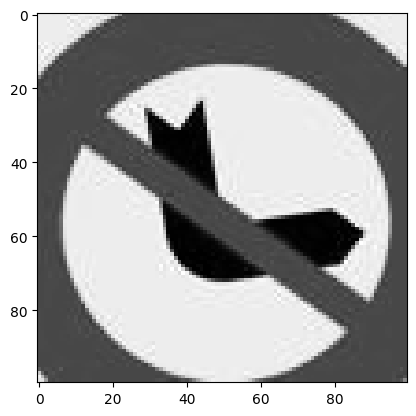

In [4]:
#Test the data read from training set and its label
import matplotlib.pyplot as plt

index = 3
label = label_train_final[index]
print(num_to_kh([label])) 
plt.imshow(images_train[index,0], cmap='gray')
plt.show()

## 2. Data Loader

In [5]:
# Create a data loader
import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
class KHCharTrain(Dataset):
  def __init__(self, images, labels):
    self.images = images
    self.labels = labels
  
  def __len__(self):
    return len(self.images)
  
  def __getitem__(self, index):
    x = torch.tensor(self.images[index], dtype=torch.float32)/255 #scale the image from 0-1
    x = torch.permute(x, (0, 1, 2)) #change dimension 
    y = F.one_hot(torch.tensor(self.labels[index], dtype=torch.long), num_classes=45).type(torch.float32) # (45 classes)
    return x, y

loader = DataLoader(KHCharTrain(images_train, label_train_final), batch_size=20, shuffle=True)
#test the data loader
for i, (x, y) in enumerate(loader):
  print(i, x.size(), y.size())


0 torch.Size([20, 1, 100, 100]) torch.Size([20, 45])
1 torch.Size([20, 1, 100, 100]) torch.Size([20, 45])
2 torch.Size([20, 1, 100, 100]) torch.Size([20, 45])
3 torch.Size([20, 1, 100, 100]) torch.Size([20, 45])
4 torch.Size([20, 1, 100, 100]) torch.Size([20, 45])
5 torch.Size([20, 1, 100, 100]) torch.Size([20, 45])
6 torch.Size([20, 1, 100, 100]) torch.Size([20, 45])
7 torch.Size([20, 1, 100, 100]) torch.Size([20, 45])
8 torch.Size([20, 1, 100, 100]) torch.Size([20, 45])
9 torch.Size([20, 1, 100, 100]) torch.Size([20, 45])
10 torch.Size([20, 1, 100, 100]) torch.Size([20, 45])
11 torch.Size([20, 1, 100, 100]) torch.Size([20, 45])
12 torch.Size([20, 1, 100, 100]) torch.Size([20, 45])
13 torch.Size([20, 1, 100, 100]) torch.Size([20, 45])
14 torch.Size([20, 1, 100, 100]) torch.Size([20, 45])
15 torch.Size([20, 1, 100, 100]) torch.Size([20, 45])
16 torch.Size([20, 1, 100, 100]) torch.Size([20, 45])
17 torch.Size([20, 1, 100, 100]) torch.Size([20, 45])
18 torch.Size([20, 1, 100, 100]) torch

In [6]:
from PIL import Image
import os
import numpy as np

# Read data for training set
path_test = r'D:\FST NUBB\ប្រកួត\Deep Learning-based Traffic Sign Detection System for Enhancing Road Safety in Battambang\Deep learning project\Test'
images_test = []
label_test_final = []

# Define square size
square_size = 100

# Iterate over subdirectories (labels) in the training directory
for label in range(45):
    label_dir = os.path.join(path_train, str(label))
    for file_name in os.listdir(label_dir):
        img_path = os.path.join(label_dir, file_name)

        # Print path to check correctness
        print(f"Loading image: {img_path}")

        # Check file extension before loading image
        valid_extensions = ['.jpg', '.png', '.jpeg']
        file_extension = os.path.splitext(file_name)[1].lower()

        if file_extension in valid_extensions:
            try:
                # Use PIL to open the image
                img = Image.open(img_path).convert('L')  # Convert to grayscale
                img = img.resize((square_size, square_size))
                img = np.array(img)  # Convert PIL image to numpy array

                if img is not None and img.size > 0:
                    images_test.append(img)
                    label_test_final.append(label)
                else:
                    print(f"Warning: Image is empty or not valid: {img_path}")
            except Exception as e:
                print(f"Error loading image {img_path}: {e}")
        else:
            print(f"Skipping non-image file: {img_path}")

# Convert lists to NumPy arrays
label_test_final = np.array(label_test_final)
images_test = np.array(images_test).reshape(-1, 1, square_size, square_size)

# Print shapes and sample labels
print(len(images_test))
print(images_test.shape)
print(label_test_final.shape)
print(label_test_final[:])


Loading image: D:\FST NUBB\ប្រកួត\Deep Learning-based Traffic Sign Detection System for Enhancing Road Safety in Battambang\Deep learning project\Train\0\0.jpg
Loading image: D:\FST NUBB\ប្រកួត\Deep Learning-based Traffic Sign Detection System for Enhancing Road Safety in Battambang\Deep learning project\Train\0\0_original_0.png_0017f44c-67f2-41ab-89e1-1676cb0481c1.jpg
Loading image: D:\FST NUBB\ប្រកួត\Deep Learning-based Traffic Sign Detection System for Enhancing Road Safety in Battambang\Deep learning project\Train\0\0_original_0.png_0018c970-cacb-4f79-a051-acd5f4770d4a.jpg
Loading image: D:\FST NUBB\ប្រកួត\Deep Learning-based Traffic Sign Detection System for Enhancing Road Safety in Battambang\Deep learning project\Train\0\0_original_0.png_002bc602-3b1d-40eb-99cf-4ab37d008c07.jpg
Loading image: D:\FST NUBB\ប្រកួត\Deep Learning-based Traffic Sign Detection System for Enhancing Road Safety in Battambang\Deep learning project\Train\0\0_original_0.png_00434e22-0552-4f27-a5d5-ca542bd60

ហាមចូល
NO ENTRY
លេខកូដ : PW03-R1-04
ខ្លឹមសារ : សញ្ញានេះ ហាមចូលចំពោះយានជំនិះគ្រប់ប្រភេទ ។


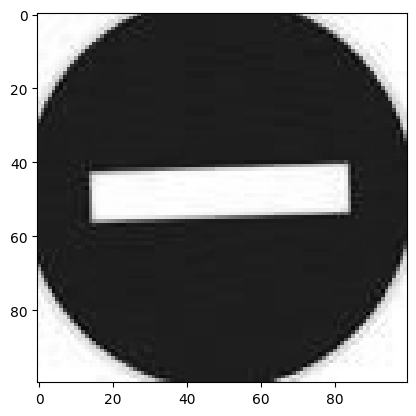

In [7]:
#Test the data read from test set and its label
import matplotlib.pyplot as plt

index = 10000
label = label_test_final[index]
print(num_to_kh([label])) 
plt.imshow(images_test[index, 0], cmap='gray')
plt.show()

In [8]:
images_test_tx = torch.tensor(images_test, dtype=torch.float32)/255
images_test_tx 

tensor([[[[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
          [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
          [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
          ...,
          [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
          [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
          [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000]]],


        [[[0.6980, 0.6980, 0.6980,  ..., 0.6980, 0.6980, 0.6980],
          [0.6980, 0.6980, 0.6980,  ..., 0.6980, 0.6980, 0.6980],
          [0.6980, 0.6980, 0.6980,  ..., 0.6980, 0.6980, 0.6980],
          ...,
          [0.6980, 0.6980, 0.6980,  ..., 0.6980, 0.6980, 0.6980],
          [0.6980, 0.6980, 0.6980,  ..., 0.6980, 0.6980, 0.6980],
          [0.6980, 0.6980, 0.6980,  ..., 0.6980, 0.6980, 0.6980]]],


        [[[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
          [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
          [1.0000, 1.0000, 1.0000,  ..

In [9]:
for i, (x, y) in enumerate(loader):
    if i==25:
        img =x
        lab = y

In [10]:
img[0].shape

torch.Size([1, 100, 100])

tensor([0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0.])


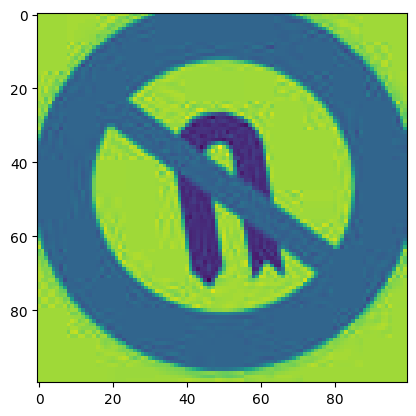

In [11]:

x = torch.permute(img[0], (1, 2, 0))
plt.imshow(x)
print(lab[0])

## 3. CNN model 

In [1]:
# #__________________________MODEL CNN______________________________
# import torch
# import torch.nn as nn
# import torch.optim as optim
# class KHCNN2(nn.Module):
#     def __init__(self):
#         super(KHCNN2, self).__init__()
#         self.conv_layers = nn.Sequential(
#             nn.Conv2d(1, 12, 3, padding='same'), 
#             nn.ReLU(),
#             nn.MaxPool2d(2, 2),               # (b, 6, 50, 50)
#             nn.Conv2d(12, 24, 3, padding='same'),  
#             nn.ReLU(),
#             nn.MaxPool2d(2, 2),               # (b, 12, 25, 25)
#             nn.Conv2d(24, 48, 3, padding='same'), 
#             nn.ReLU(),
#             nn.MaxPool2d(2, 2),               # (b, 20, 12, 12)
#             nn.Conv2d(48, 52, 3, padding='same'),  
#             nn.ReLU(),
#             nn.MaxPool2d(2, 2),               # (b, 24, 6, 6)
#             nn.Conv2d(52, 48, 3, padding='same'),
#             nn.ReLU(),
#             nn.MaxPool2d(2,2),
#             nn.Conv2d(48,33, 3)
            
#         )

#     def forward(self, x):
#         output = self.conv_layers(x)
#         return torch.squeeze(output)


In [12]:
import torch
import torch.nn as nn
import torch.optim as optim

class KHCNN2(nn.Module):
    def __init__(self):
        super(KHCNN2, self).__init__()
        
        # Convolutional layers
        self.conv_layers = nn.Sequential(
            nn.Conv2d(1, 12, 3, padding='same'),  # (b, 12, 100, 100)
            nn.ReLU(),
            nn.MaxPool2d(2, 2),                  # (b, 12, 50, 50)
            nn.Conv2d(12, 24, 3, padding='same'), # (b, 24, 50, 50)
            nn.ReLU(),
            nn.MaxPool2d(2, 2),                  # (b, 24, 25, 25)
            nn.Conv2d(24, 48, 3, padding='same'), # (b, 48, 25, 25)
            nn.ReLU(),
            nn.MaxPool2d(2, 2),                  # (b, 48, 12, 12)
            nn.Conv2d(48, 52, 3, padding='same'), # (b, 52, 12, 12)
            nn.ReLU(),
            nn.MaxPool2d(2, 2),                  # (b, 52, 6, 6)
            nn.Conv2d(52, 45, 3, padding='same')  # (b, 45, 6, 6)
        )
        
        # Fully connected layers
        self.fc_layers = nn.Sequential(
            nn.Flatten(),                         # Flatten the 45 x 6 x 6 output into 1620 (45 * 6 * 6)
            nn.Linear(45 * 6 * 6, 512),           # FC layer to reduce the number of features
            nn.ReLU(),
            nn.Linear(512, 45),                   # Output layer (45 classes)
            nn.Softmax(dim=1)                     # Softmax for probability output
        )

    def forward(self, x):
        x = self.conv_layers(x)   # Pass through convolutional layers
        x = self.fc_layers(x)     # Pass through fully connected layers
        return x


Check GPU before Training the datas

In [ ]:
# !nvidia-smi
# !deviceQuery
# !nvcc --version

In [ ]:
# import torch
# print(torch.cuda.is_available())
# print(torch.cuda.device_count())

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader

my_net2 = KHCNN2()
optimizer = optim.Adam(my_net2.parameters())
cost_func = nn.MSELoss()
loader = DataLoader(KHCharTrain(images_train, label_train_final), batch_size=330, shuffle=True)

n_epoch = 200  # Train for 200 epochs
for epoch in range(n_epoch):
    for i, (x, y) in enumerate(loader):
        z = my_net2(x)  # tensor(b, 45)
        cost = cost_func(z, y)

        if i == 0:
            print(f"Epoch {epoch + 1}, Batch {i + 1}, Loss: {cost.item():.10f}")

        optimizer.zero_grad()  
        cost.backward()
        optimizer.step()

    # Save the model at the last epoch
    if epoch == n_epoch - 1:
        checkpoint_path = f"model_epoch_{epoch + 1}.pt"
        torch.save(my_net2.state_dict(), checkpoint_path)
        print(f"Model saved at {checkpoint_path}")


In [25]:
idx = 1
print(images_test_tx[idx].shape)


torch.Size([1, 100, 100])


ហាមបត់ឆ្វេង
NO TURN LEFT
លេខកូដ : PW03-R1-01
ខ្លឹមសារ : សញ្ញានេះ ហាមយានជំនិះគ្រប់ប្រភេទ បត់ឆ្វេង ។


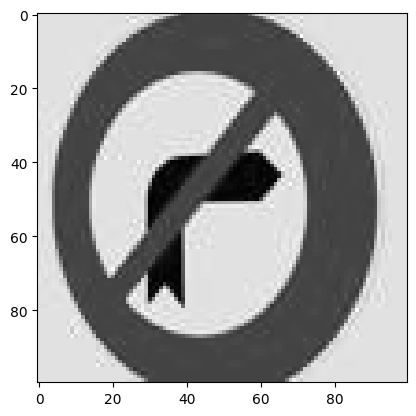

In [26]:

test = my_net2(images_test_tx[idx].unsqueeze(0))  # Add a batch dimension if needed

# Get the predicted label
out = torch.argmax(test).item()

# Convert the predicted label to Khmer
lab = num_to_kh([out])  # Pass the prediction as a list
print(lab)

# Visualize the image
plt.imshow(images_test[idx][0].squeeze(), cmap='gray')  # Squeeze to remove extra dimension
plt.show()


In [28]:
label_test_final

array([ 0,  0,  0, ..., 44, 44, 44])

## 4.Evaluation 

In [30]:
score = 0
for idx in range(len(images_test)):
    test_input = images_test_tx[idx].unsqueeze(0)  # Add a batch dimension, making it [1, 1, 100, 100]
    test = my_net2(test_input)
    out = torch.argmax(test).item()
    
    # Get the actual label
    act = label_test_final[idx]
    
    # Update the score if prediction matches the actual label
    if act == out:
        score += 1

# Calculate accuracy
acc = score / len(images_test)

# Print the results
print(f"Accuracy: {acc:.4f}")
print(f"Accuracy(%): {acc * 100:.2f}%")


Accuracy: 0.9661
Accuracy(%): 96.61%


## 5. Test real data


Predicted Label:  ហាមបត់ឆ្វេង
NO TURN LEFT
លេខកូដ : PW03-R1-01
ខ្លឹមសារ : សញ្ញានេះ ហាមយានជំនិះគ្រប់ប្រភេទ បត់ឆ្វេង ។


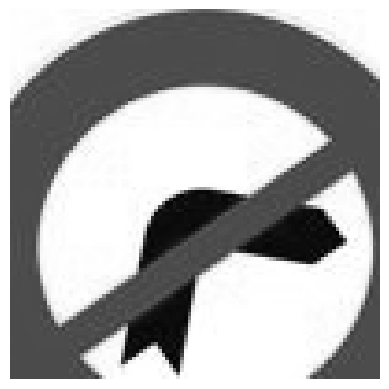

In [ ]:
import torch
from torchvision.transforms import ToTensor, Grayscale, Resize
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

# Load the saved model
checkpoint = torch.load('../Deep learning project/model_epoch_200.pt')

# Create an instance of your model
my_net2 = KHCNN2()

# Load the model's state dictionary
my_net2.load_state_dict(checkpoint)

# Set the model to evaluation mode
my_net2.eval()

# Set device (GPU if available)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
my_net2.to(device)  # Ensure the model is moved to the correct device

# List of image paths
# image_paths = ['./Valid/44/19.jpg']
image_paths = ['./Valid/0/0_original_0.png_1f302f64-893c-41fe-9aa0-47accf16799e.jpg']

# Perform inference for each image
for image_path in image_paths:
    # Load and preprocess the image
    image = Image.open(image_path)
    resized_image = Resize((100, 100))(image)  # Resize to 100x100
    grayscale_image = Grayscale()(resized_image)  # Convert to grayscale
    tensor = ToTensor()(grayscale_image).unsqueeze(0).to(device)  # Add batch dimension and move to device

    # Perform inference using the loaded model
    with torch.no_grad():
        output = my_net2(tensor)

    # Get the predicted label
    predicted_label = torch.argmax(output).item()
    predicted_label = [predicted_label]
    label_khmer = num_to_kh(predicted_label)

    # Display the result
    plt.imshow(grayscale_image, cmap='gray')
    print("Predicted Label: ", label_khmer)

    # Load Khmer font for the title
    # font_path = '.\Fonts\KhmerOSsiemreap.ttf'  
    # prop = fm.FontProperties(fname=font_path)

    # plt.title(f" Predicted Label :  [ {label_khmer} ] ", fontproperties=prop)
    plt.axis('off')  # Hide axes
    plt.show()
